# Übung1: Explorative Analyse und Vorverarbeitung

## 1. Explorative Analyse des Datensatzes "Boston Housing"

In [6]:
import pandas as pd
import numpy as np
import json
import zipfile
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import cm

np.set_printoptions(suppress=True, linewidth=np.inf)

In [7]:
'''
Attribute Information:
1. CRIM      per capita crime rate by town
2. ZN        proportion of residential land zoned for lots over 25,000 sq.ft.
3. INDUS     proportion of non-retail business acres per town
4. CHAS      Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
5. NOX       nitric oxides concentration (parts per 10 million)
6. RM        average number of rooms per dwelling
7. AGE       proportion of owner-occupied units built prior to 1940
8. DIS       weighted distances to five Boston employment centres
9. RAD       index of accessibility to radial highways
10. TAX      full-value property-tax rate per $10,000
11. PTRATIO  pupil-teacher ratio by town
12. B        1000(Bk - 0.63)^2 where Bk is the proportion of blacks by town
13. LSTAT    % lower status of the population
14. MEDV     Median value of owner-occupied homes in $1000's
'''

url = 'https://archive.ics.uci.edu/ml/machine-learning-databases/housing/housing.data'
cols = ['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX', 'PTRATIO', 'B', 'LSTAT', 'TGT']
boston = pd.read_csv(url, sep=' ', skipinitialspace=True, header=None, names=cols, index_col=False)
boston

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,TGT
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0,0.573,6.593,69.1,2.4786,1,273.0,21.0,391.99,9.67,22.4
502,0.04527,0.0,11.93,0,0.573,6.120,76.7,2.2875,1,273.0,21.0,396.90,9.08,20.6
503,0.06076,0.0,11.93,0,0.573,6.976,91.0,2.1675,1,273.0,21.0,396.90,5.64,23.9
504,0.10959,0.0,11.93,0,0.573,6.794,89.3,2.3889,1,273.0,21.0,393.45,6.48,22.0


### A: Explorative Datenanalyse

#### i: Korrelationen betrachten

In [8]:
corr = boston.corr()
cmap = cm.get_cmap('Greens', 256)
corr.style.background_gradient(cmap=cmap, axis=None).set_precision(2)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,TGT
CRIM,1,-0.2,0.41,-0.056,0.42,-0.22,0.35,-0.38,0.63,0.58,0.29,-0.39,0.46,-0.39
ZN,-0.2,1,-0.53,-0.043,-0.52,0.31,-0.57,0.66,-0.31,-0.31,-0.39,0.18,-0.41,0.36
INDUS,0.41,-0.53,1,0.063,0.76,-0.39,0.64,-0.71,0.6,0.72,0.38,-0.36,0.6,-0.48
CHAS,-0.056,-0.043,0.063,1,0.091,0.091,0.087,-0.099,-0.0074,-0.036,-0.12,0.049,-0.054,0.18
NOX,0.42,-0.52,0.76,0.091,1,-0.3,0.73,-0.77,0.61,0.67,0.19,-0.38,0.59,-0.43
RM,-0.22,0.31,-0.39,0.091,-0.3,1,-0.24,0.21,-0.21,-0.29,-0.36,0.13,-0.61,0.7
AGE,0.35,-0.57,0.64,0.087,0.73,-0.24,1,-0.75,0.46,0.51,0.26,-0.27,0.6,-0.38
DIS,-0.38,0.66,-0.71,-0.099,-0.77,0.21,-0.75,1,-0.49,-0.53,-0.23,0.29,-0.5,0.25
RAD,0.63,-0.31,0.6,-0.0074,0.61,-0.21,0.46,-0.49,1,0.91,0.46,-0.44,0.49,-0.38
TAX,0.58,-0.31,0.72,-0.036,0.67,-0.29,0.51,-0.53,0.91,1,0.46,-0.44,0.54,-0.47


#### ii: Verteilung der Variablen

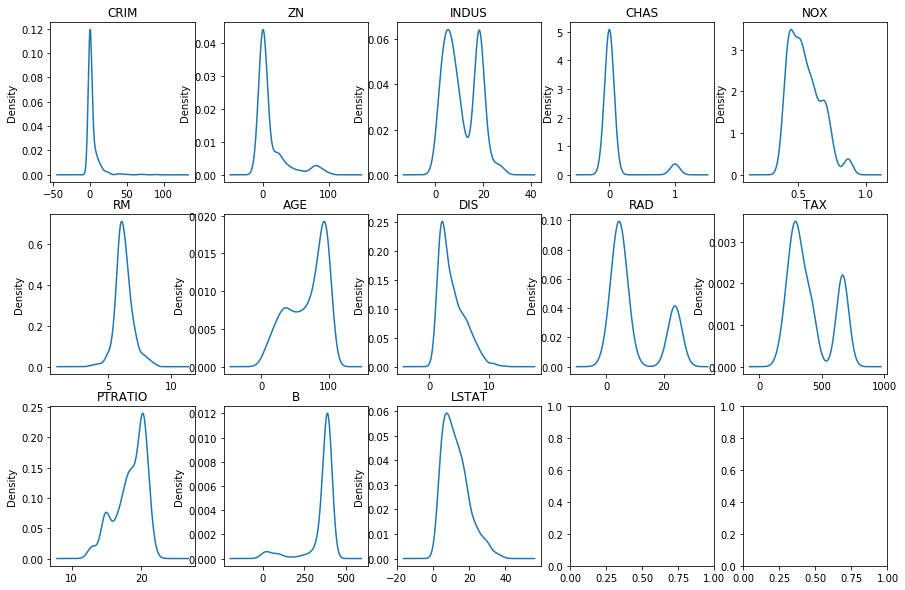

In [9]:
fig, axs = plt.subplots(3,5, figsize=(15,10))
for i in range(13):
    boston[cols[i]].plot(kind='kde', ax=axs[i//5, i%5])
    axs[i//5, i%5].set_title(cols[i])

### B: Fragen beantworten

#### 1. Welche der Variablen sind kategorisch?

A: Keine der Variablen ist kategorisch.

#### 2. Welche der Variablen eignen sich gut zur Vorhersage des Hauspreises und warum?

A: Die Variable **RM** eignet sich gut das sie mit dem Hauspreis **TGT** stark positiv korreliert ist und ebenso die Variable **LSTAT** weil sie stark negativ korreliert ist. D.h wenn **RM** hoch ist oder wenn **LSTAT** niedriger ist, ist der Hauspreis **TGT** hoch.

#### 3. Welche dieser Variablen sind miteinander korreliert?

A: Alle Variablen sind unterschiedlich stark positiv oder negativ mit allen anderen Variablen korreliert.

#### 4. Welche sind daher Kandidate, die man evtl. weglassen könnte?

A: Weglassen könnte man Variablen die mit **TGT** weder stark positiv noch stark negativ korreliert sind, also alle außer **LSTAT** und **RM**. Da aber aus der Korrelation nur der lineare Zusammenhang abgelesen werden kann muss mit weitern Techniken wie der PCA untersucht werden wie stark die Variablen Einfluss auf den Hauspreis **TGT** haben.

### C: Dokumentation der eingesetzen Systemkonfiguration

In [10]:
%reload_ext version_information
%version_information numpy, pandas, json, zipfile, matplotlib

Software versions
Python 3.7.4 64bit [GCC 7.3.0]
IPython 7.8.0
OS Linux 4.15.0 65 generic x86_64 with debian buster sid
numpy 1.17.2
pandas 0.25.1
json 2.0.9
zipfile The 'zipfile' distribution was not found and is required by the application
matplotlib 3.1.1
Mon Oct 14 11:00:13 2019 CEST

## 2. Datenvorverarbeitung mit Pandas: Food Nutrient Database

### A: Einlesen der Daten

In [11]:
filename = "foods-2011-10-03.json"
z = zipfile.ZipFile("./../"+filename+".zip", "r")
data = json.loads(z.open(filename).read().decode("utf-8"))
data

[{'id': 1008,
  'description': 'Cheese, caraway',
  'tags': [],
  'manufacturer': '',
  'group': 'Dairy and Egg Products',
  'portions': [{'amount': 1, 'unit': 'oz', 'grams': 28.35}],
  'nutrients': [{'value': 25.18,
    'units': 'g',
    'description': 'Protein',
    'group': 'Composition'},
   {'value': 29.2,
    'units': 'g',
    'description': 'Total lipid (fat)',
    'group': 'Composition'},
   {'value': 3.06,
    'units': 'g',
    'description': 'Carbohydrate, by difference',
    'group': 'Composition'},
   {'value': 3.28, 'units': 'g', 'description': 'Ash', 'group': 'Other'},
   {'value': 376.0,
    'units': 'kcal',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 39.28,
    'units': 'g',
    'description': 'Water',
    'group': 'Composition'},
   {'value': 1573.0,
    'units': 'kJ',
    'description': 'Energy',
    'group': 'Energy'},
   {'value': 0.0,
    'units': 'g',
    'description': 'Fiber, total dietary',
    'group': 'Composition'},
   {'value': 673.0,


### B: Datenbearbeitung und Bereinigung

In [12]:
info = pd.DataFrame(data, columns=['description', 'group', 'id', 'manufacturer'])
info

,description,group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [13]:
nutrients_array = []
for food in data:
    id = pd.DataFrame(np.full(len(food['nutrients']), fill_value=food['id']), columns=['id'])
    nutrient = pd.DataFrame(food['nutrients'])
    concated = pd.concat([nutrient, id], axis=1)
    nutrients_array.append(concated)
nutrients_array

[       value units                         description        group    id
 0     25.180     g                             Protein  Composition  1008
 1     29.200     g                   Total lipid (fat)  Composition  1008
 2      3.060     g         Carbohydrate, by difference  Composition  1008
 3      3.280     g                                 Ash        Other  1008
 4    376.000  kcal                              Energy       Energy  1008
 ..       ...   ...                                 ...          ...   ...
 157    1.472     g                              Serine  Amino Acids  1008
 158   93.000    mg                         Cholesterol        Other  1008
 159   18.584     g        Fatty acids, total saturated        Other  1008
 160    8.275     g  Fatty acids, total monounsaturated        Other  1008
 161    0.830     g  Fatty acids, total polyunsaturated        Other  1008
 
 [162 rows x 5 columns],
        value units                         description        group    i

In [14]:
nutrients = pd.concat(nutrients_array)
nutrients

,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [15]:
nutrients_tmp = nutrients.copy()
nutrients_tmp.drop_duplicates(subset=['description', 'id'], keep="first", inplace=True)
nutrients_tmp

,value,units,description,group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [16]:
pre_df = nutrients[nutrients['description'].str.match('Protein')]
pre_df = pre_df[pre_df['id'] == 1008]
pre_df

,value,units,description,group,id
0,25.18,g,Protein,Composition,1008
54,25.18,g,Protein,Composition,1008
108,25.18,g,Protein,Composition,1008


In [17]:
post_df = nutrients_tmp[nutrients_tmp['description'].str.match('Protein')]
post_df = post_df[post_df['id'] == 1008]
post_df

,value,units,description,group,id
0,25.18,g,Protein,Composition,1008


In [18]:
info = info.rename(columns={"description": "food_description", "group": "food_group"})
info

,food_description,food_group,id,manufacturer
0,"Cheese, caraway",Dairy and Egg Products,1008,
1,"Cheese, cheddar",Dairy and Egg Products,1009,
2,"Cheese, edam",Dairy and Egg Products,1018,
3,"Cheese, feta",Dairy and Egg Products,1019,
4,"Cheese, mozzarella, part skim milk",Dairy and Egg Products,1028,
...,...,...,...,...
6631,"Bologna, beef, low fat",Sausages and Luncheon Meats,42161,
6632,"Turkey and pork sausage, fresh, bulk, patty or...",Sausages and Luncheon Meats,42173,
6633,"Babyfood, juice, pear",Baby Foods,43408,None
6634,"Babyfood, dessert, banana yogurt, strained",Baby Foods,43539,None


In [19]:
nutrients = nutrients_tmp.copy()
nutrients = nutrients.rename(columns={"description": "nutrition_description", "group": "nutrition_group"})
nutrients

,value,units,nutrition_description,nutrition_group,id
0,25.180,g,Protein,Composition,1008
1,29.200,g,Total lipid (fat),Composition,1008
2,3.060,g,"Carbohydrate, by difference",Composition,1008
3,3.280,g,Ash,Other,1008
4,376.000,kcal,Energy,Energy,1008
...,...,...,...,...,...
45,0.000,mcg,"Vitamin B-12, added",Vitamins,43546
46,0.000,mg,Cholesterol,Other,43546
47,0.072,g,"Fatty acids, total saturated",Other,43546
48,0.028,g,"Fatty acids, total monounsaturated",Other,43546


In [20]:
X = pd.merge(nutrients, info, on='id', how='outer')
X

,value,units,nutrition_description,nutrition_group,id,food_description,food_group,manufacturer
0,25.180,g,Protein,Composition,1008,"Cheese, caraway",Dairy and Egg Products,
1,29.200,g,Total lipid (fat),Composition,1008,"Cheese, caraway",Dairy and Egg Products,
2,3.060,g,"Carbohydrate, by difference",Composition,1008,"Cheese, caraway",Dairy and Egg Products,
3,3.280,g,Ash,Other,1008,"Cheese, caraway",Dairy and Egg Products,
4,376.000,kcal,Energy,Energy,1008,"Cheese, caraway",Dairy and Egg Products,
...,...,...,...,...,...,...,...,...
368563,0.000,mcg,"Vitamin B-12, added",Vitamins,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None
368564,0.000,mg,Cholesterol,Other,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None
368565,0.072,g,"Fatty acids, total saturated",Other,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None
368566,0.028,g,"Fatty acids, total monounsaturated",Other,43546,"Babyfood, banana no tapioca, strained",Baby Foods,None


### C: Daten auf Zink untersuchen

In [21]:
zinc_df = X[X['nutrition_description'].str.match('Zinc, Zn')]
zinc_value_df = zinc_df['value']
zinc_value_df.describe()

count    6137.000000
mean        2.228589
std         3.975321
min         0.000000
25%         0.340000
50%         0.980000
75%         2.980000
max        90.950000
Name: value, dtype: float64

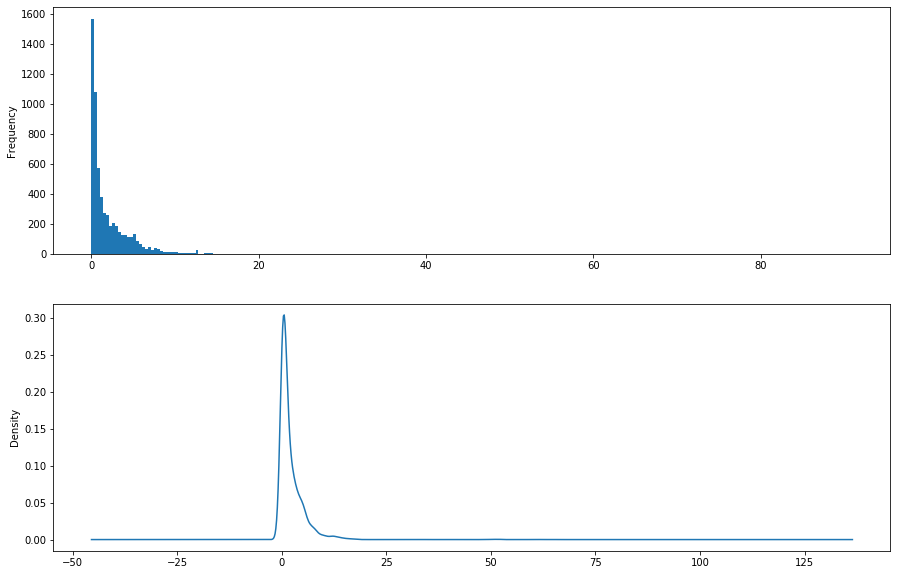

In [22]:
fig, axs = plt.subplots(2, figsize=(15,10))
zinc_value_df.plot(kind='hist', bins=256, ax=axs[0])
zinc_value_df.plot(kind='kde', ax=axs[1])

#### Hat Edamer einen überdurchschnittlichen Zinkgehalt?

In [23]:
cheese_edam = X[X['food_description'].str.match('Cheese, edam')]
cheese_edam_zinc = cheese_edam[cheese_edam['nutrition_description'].str.match('Zinc, Zn')]
cheese_edam_zinc

,value,units,nutrition_description,nutrition_group,id,food_description,food_group,manufacturer
148,3.75,mg,"Zinc, Zn",Elements,1018,"Cheese, edam",Dairy and Egg Products,


In [24]:
np.mean(zinc_value_df)

2.228588887078377

A: Ja, der durchschnittliche Zingehalt liegt unter dem Mittelwert von 2.228588887078377.

#### Haben mehr als 75% aller Nahrungsmittel einen kleineren Zinkgehalt?

In [25]:
np.quantile(zinc_df['value'], 0.75) < cheese_edam_zinc['value']

148    True
Name: value, dtype: bool

A: Ja, 75% der Nahrungsmittel besitzen mit 2.98 einen kleineren Zinkgehalt.

#### Welches Nahrungsmittel hat den maximalen Zinkgehalt?

In [26]:
zinc_df[zinc_df['value'] == np.max(zinc_df['value'])]

,value,units,nutrition_description,nutrition_group,id,food_description,food_group,manufacturer
327797,90.95,mg,"Zinc, Zn",Elements,15170,"Mollusks, oyster, eastern, canned",Finfish and Shellfish Products,


A: Muscheln haben den höchsten Zinkgehalt.